In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
# Any results you write to the current directory are saved as output.

In [2]:
import random
import glob
import shutil
import warnings

import cv2 # image manipulate
import scipy # latents variable generation
import matplotlib.pyplot as plt # for ploting
import xml.etree.ElementTree as ET # for tree, reshape images
import albumentations as A # image augmentation
from sklearn.preprocessing import LabelEncoder # labeling target
from PIL import Image # image read
from albumentations.pytorch import ToTensor # image augmentation

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils import spectral_norm
import torch.optim as optim
from torch.utils.data import DataLoader,Dataset
from torchvision.utils import make_grid, save_image # plotting and  save image.
from tqdm import tqdm_notebook as tqdm # visualizing

%matplotlib inline 
# better plotting
warnings.filterwarnings('ignore',category=FutureWarning)
device = 'cuda' if torch.cuda.is_available() else 'cpu'

### Hyperparameters and random seed setting

In [3]:
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] =str(seed) 
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.determinitic = True


hyper = {'Dataloader': {'batch_size': 100, # first dimension
                      'shuffle':True}, # of course
         'Generator' : {'z_dim' : 100, # the length of z 
                       'embed_dim': 32, # the length of one label.
                       'ch': 64, # channel factor 
                       'num_classes':120,# in the dataset we have 120 breeds of dogs.
                       'use_attn': True}, # all you need is attn
         'Discriminator': {'ch': 64, #same
                          'num_classes': 120, # same
                          'use_attn': True},
         'sample_z': {'z_dim': 100,
                     'num_classes': 120},
         'num_iteration': 26000, # train 26000 iter
         'decay_start' : 25000, # getting the result from graph
         'd_step' : 1, 
         'lr_D': 4e-4,
         'lr_G': 2e-4, # generator should learn slower.
         'betas': (0.0, # adam hyperparameter
                  0.999),
         'margin': 1.0, # loss trade off
         'gamma':0.1, 
         'ema': 0.999,
         'seed': 224} # my favorite seed

seed_everything(hyper['seed'])


### reshape pics

In [4]:
breeds = os.listdir('../input/annotation/Annotation') # a list of dogs' breed.
# crop the photo make it only has dog.
idxIn = 0; namesIn = []
imagesMt = [] # 
transform = A.Compose([A.Resize(64,64,interpolation=cv2.INTER_AREA),
                       A.Normalize((.5,.5,.5),(.5,.5,.5))])

for breed in breeds:
    for dog in os.listdir('../input/annotation/Annotation/' + breed):
        #print(dog)
        try:
            img = Image.open('../input/all-dogs/all-dogs/' + dog + '.jpg') # get a image.
            width,height = img.size
        except:
            continue
        
        tree = ET.parse('../input/annotation/Annotation/' + breed + '/' + dog)
        root = tree.getroot()

        objects = root.findall('object')
        #print(objects)
        for o in objects:
            bndbox = o.find('bndbox') # reading bound box
            xmin = int(bndbox.find('xmin').text)
            ymin = int(bndbox.find('ymin').text)
            xmax = int(bndbox.find('xmax').text)
            ymax = int(bndbox.find('ymax').text)
            
            xlen = xmax - xmin
            ylen = ymax - ymin
            
            if xlen > ylen:
                diff = xlen - ylen
                minpad = min(ymin,diff//2) 
                maxpad = min(height-ymax,diff-minpad)
                ymin = ymin - minpad
                ymax = ymax + maxpad # add the span in y_axis as much as possible, instead of padding 0 in the pic.
                
            elif ylen>xlen:
                diff = ylen - xlen
                minpad = min(xmin,diff//2) 
                maxpad = min(width-xmax,diff-minpad)
                xmin = xmin - minpad
                xmax = xmax + maxpad
            
            cvimg = cv2.imread('../input/all-dogs/all-dogs/' + dog + '.jpg')
           
            cvimg = cv2.cvtColor(cvimg,cv2.COLOR_BGR2RGB)
            #print(cvimg)
            # getting the dog pic 
            cvimg = cvimg[ymin:ymax,xmin:xmax] # channel last!
            cvimg = transform(image = cvimg)['image']
            imagesMt.append(cvimg)
            namesIn.append(breed)
            idxIn += 1
imagesMt = np.array(imagesMt)            


In [5]:
# we have 120 breeds
le = LabelEncoder()
numeric_labels = le.fit_transform(namesIn)
print(' We have {} breeds of dog !!!!!'.format(len(set(numeric_labels))))

 We have 120 breeds of dog !!!!!


### Plot some pics of dog.

In [6]:
class Dogdataset(Dataset):
    def __init__(self,images,labels):
        super().__init__()
        self.images = images
        self.labels = labels
        self.tranforms2tensor = A.Compose([A.HorizontalFlip(p=.5),# Using only flip!
                                           ToTensor()])
        
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self,idx):
        image,label = self.images[idx],self.labels[idx]
        image = self.tranforms2tensor(image=image)['image']
        label = torch.as_tensor(label,dtype =torch.long)
        
        return image,label
    

### Define a generator 

In [7]:
def get_loader(images,labels,loader_params,device='cpu'):
    dataset = Dogdataset(images,labels)
    trainloader = DataLoader(dataset,**loader_params)
    batch_size = loader_params['batch_size']
    
    while True:
        for imgs,labs in trainloader:
            if batch_size != imgs.size(0):
                break
            else:
                imgs,labs = imgs.to(device),labs.to(device)
                imgs += (1.0/128.0) * torch.rand_like(imgs) # adding noise make model robust.
                
                yield imgs,labs
                
trainloader = get_loader(imagesMt,numeric_labels,hyper['Dataloader'],device=device) #  we get the loader.

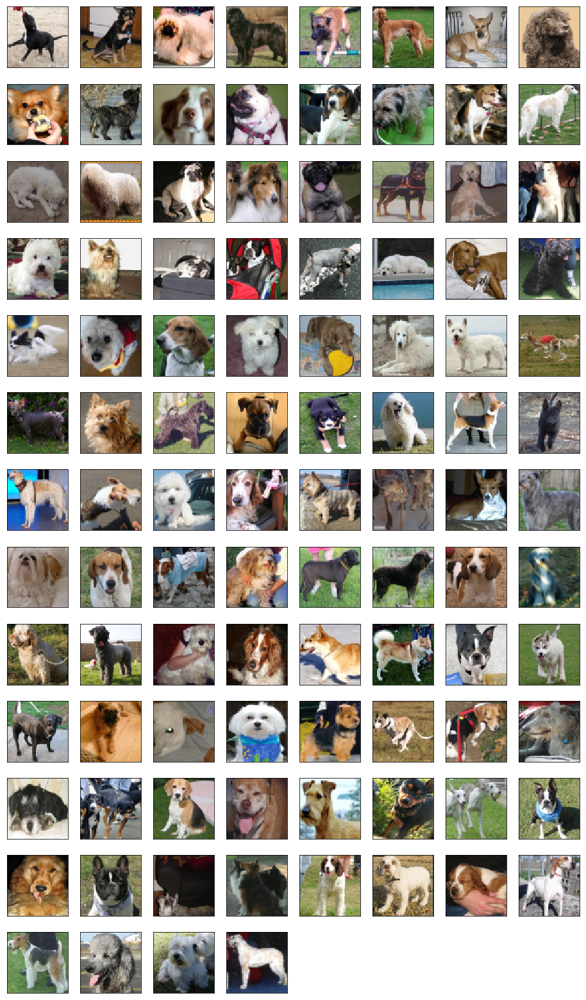

In [8]:

imgs = next(iter(trainloader))
imgs = imgs[0].cpu().numpy().transpose(0, 2, 3, 1)

fig = plt.figure(figsize=(16, 35))
for ii, img in enumerate(imgs):
    ax = fig.add_subplot(16, 8, ii + 1, xticks=[], yticks=[])
    plt.imshow((img+1)/2)

### Model Attn 
#### we first build block and then gennerator and discriminator.


In [9]:
class Attn(nn.Module):
    def __init__(self,channels,reduction_attn = 8, reduction_sc = 2): # Ratio should be 4: 1
        super(Attn,self).__init__()
        self.channels_attn = channels//reduction_attn # reduce cal c
        self.channels_sc = channels//reduction_sc # reduce cal 4c
        
        #ATTN consisted of query,key and value, structure design
        
        self.qconv = spectral_norm(nn.Conv2d(channels,self.channels_attn,kernel_size = 1,bias=False)) # 1 x 1 filter
        self.kconv = spectral_norm(nn.Conv2d(channels,self.channels_attn,kernel_size = 1,bias=False))
        self.vconv = spectral_norm(nn.Conv2d(channels,self.channels_sc,kernel_size = 1,bias=False)) # weight 
        self.attnconv = spectral_norm(nn.Conv2d(self.channels_sc,channels,kernel_size = 1,bias=False))
        self.gamma = nn.Parameter(torch.zeros(1))
        
        # initializing weights
        nn.init.orthogonal_(self.qconv.weight.data)
        nn.init.orthogonal_(self.kconv.weight.data)
        nn.init.orthogonal_(self.vconv.weight.data)
        nn.init.orthogonal_(self.attnconv.weight.data)
        
    def forward(self,x):
        
        batch,_,h,w = x.size() # original channel size is not important
        
        qx = self.qconv(x).view(batch,self.channels_attn,-1) # b x oc x h x w >>>>> b x c x hw 
        kx = F.max_pool2d(self.kconv(x),2).view(batch,self.channels_attn,-1) # b x c x h/2 x w/2 >>>>> b x c x hw/4
        
        attn = torch.bmm(kx.permute(0,2,1),qx) # b x hw/4 x c and b x c x hw >>>>>> b x hw/4 x hw
        attn = F.softmax(attn,dim=1)
        
        vx = F.max_pool2d(self.vconv(x),2).view(batch,self.channels_sc,-1) #b x c*4 x hw/4
        ##b x c*4 x hw/4 mul b x hw/4 x hw >>> b x 4c x hw
        attn = torch.bmm(vx,attn).view(batch,self.channels_sc,h,w) #b x c*4 x hw
        
        attn = self.attnconv(attn) # b,oc,h,w
        
        out = self.gamma * attn + x  # attn plus residual
        
        return out 
    

    
        

### Genarator block and Generator

In [10]:
class ConditionBN(nn.Module):
    def __init__(self,num_features,num_conditions):
        ##combine x and y information.
        
        super(ConditionBN,self).__init__()
        self.bn = nn.BatchNorm2d(num_features,affine=False)
        self.embed = spectral_norm(nn.Conv2d(num_conditions,num_features*2,kernel_size=1,bias = False)) #c: y >>>> 2x
        
        nn.init.orthogonal_(self.embed.weight.data)
        
    def forward(self,x,y):
        #print(x.size(),'cb2d x ')
        out = self.bn(x) # bn images, size would not changed.b,c
        #print(out.size(),'cb2d x ')
        y = self.embed(y.unsqueeze(2).unsqueeze(3)) # adding dimension to fit conv
        #print(y.size(),'cb2d x ')
        gamma,beta = y.chunk(2,dim=1) #b,num_feature,1,1
        out = (1.0 + gamma) * out + beta 
        ## b,num_feature,(b,z) > this is out's size
        ## 4 dimension
        
        return out

class Gblock(nn.Module):
    def __init__(self,in_channels,out_channels,num_conditions,ups = False):
        super(Gblock,self).__init__()
        self.ups = ups
        self.learnable_sc = in_channels!=out_channels or ups # boolean, if same channel return false
        
        self.conv1 = spectral_norm(nn.Conv2d(in_channels,out_channels,kernel_size = 3,padding = 1,bias=False)) # b,out,h,w
        self.conv2 = spectral_norm(nn.Conv2d(out_channels,out_channels,kernel_size = 3,padding = 1,bias=False)) # b,out,h,w
        self.cbn1 = ConditionBN(in_channels,num_conditions) # b,2*in_
        self.cbn2 = ConditionBN(out_channels,num_conditions) # b, 2 * out_channel
        
        if self.learnable_sc: # short cut 
            self.conv_sc = spectral_norm(nn.Conv2d(in_channels,out_channels,kernel_size = 1,bias=False)) # channel changing
            nn.init.orthogonal_(self.conv_sc.weight.data)
        self.relu = nn.ReLU()
        
        nn.init.orthogonal_(self.conv1.weight.data)
        nn.init.orthogonal_(self.conv2.weight.data)
        
    def _up_sample(self,x,conv): # more clear in dimension !!!
        x = F.interpolate(x,scale_factor = 2, mode = 'nearest') # hw >>> 2h 2w , without parameters in this process
        #print('up',x.size())
        x = conv(x)
        
        return x
        
    def _res(self,x,y):
        # x = b, c, h, w
        # y = b, embeding
        #print(y.size(),'y before cbn1') # y is the 1/5 z vector and y embedding
        x = self.relu(self.cbn1(x, y))
        x = self._up_sample(x, self.conv1) if self.ups else self.conv1(x)
        x = self.relu(self.cbn2(x, y))
        x = self.conv2(x)
        return x 
    
    def _shortcut(self,x):
        if self.learnable_sc: # if True , ratio of in and out is 2
            x = self._up_sample(x,self.conv_sc) if self.ups else self.conv_sc(x)
        #print('2',x.size())
        return x
        
    def forward(self,x,y):
        #print(self._res(x,y).size(),self._shortcut(x).size())
        return self._res(x,y) + self._shortcut(x)
    
        
        
        

In [11]:
class Gen(nn.Module):
    def __init__(self,z_dim,ch,num_classes,embed_dim,use_attn = False):
        super(Gen,self).__init__()
        self.z_dim = z_dim
        self.ch = ch
        self.num_classes = num_classes
        self.embed_dim = embed_dim
        self.use_attn = use_attn
        self.num_chunk = 5 #1, to  image, 2,3,4,5 combine with y->latent variable
        num_z = self.__get_num_z()
        
        self.embed = nn.Embedding(num_classes,embed_dim)
        self.fc = spectral_norm(nn.Linear(num_z[0],ch*8*4*4,bias =False))
        self.b1 = Gblock(ch*8,ch*8,num_z[1],ups=True) # in and out are same 
        self.b2 = Gblock(ch*8,ch*4,num_z[2],ups=True)
        self.b3 = Gblock(ch*4,ch*2,num_z[3],ups=True)
        if use_attn:
            self.attn = Attn(ch*2)
        self.b4 = Gblock(ch*2,ch,num_z[4],ups=True)
        self.bn = nn.BatchNorm2d(ch)
        self.relu = nn.ReLU()
        self.conv2pic = spectral_norm(nn.Conv2d(ch,3,kernel_size = 3,padding = 1,bias=False))
        self.tanh = nn.Tanh()
        
        nn.init.orthogonal_(self.embed.weight.data)
        nn.init.orthogonal_(self.fc.weight.data)
        nn.init.orthogonal_(self.conv2pic.weight.data)
        nn.init.constant_(self.bn.weight.data,1.0)
        nn.init.constant_(self.bn.bias.data,0.0)
        
    def __get_num_z(self):
        xs = torch.empty(self.z_dim).chunk(self.num_chunk)
        num_z = [x.size(0) for x in xs]
        for i in range(1,self.num_chunk):
            num_z[i] += self.embed_dim  
        return num_z # getting condition size
    
    def forward(self,x,y): # x = b,z y=int

        xs = x.chunk(self.num_chunk, dim=1) # b,z/chunk 
        y = self.embed(y) # b,embeding_dim 
        
        h = self.fc(xs[0]) #b,ch*8*4*4
        h = h.view(h.size(0), self.ch*8, 4, 4) # Now it is a image！ b, c, h, w444444
        h = self.b1(h, torch.cat([y, xs[1]], dim=1)) #       b,c,8,8
        h = self.b2(h, torch.cat([y, xs[2]], dim=1))
        h = self.b3(h, torch.cat([y, xs[3]], dim=1))
        if self.use_attn:
            h = self.attn(h)
        h = self.b4(h,torch.cat([y,xs[4]],dim=1))
        h = self.relu(self.bn(h))
        out = self.tanh(self.conv2pic(h))
        
        return out  

In [12]:
class Dblock(nn.Module):
    def __init__(self,in_channels,out_channels,downs = False,optimized = False):
        super(Dblock,self).__init__()
        self.downs = downs
        self.optimized = optimized
        self.learnable_sc = in_channels != out_channels or downs
        
        self.conv1 = spectral_norm(nn.Conv2d(in_channels,out_channels,kernel_size = 3,padding = 1,bias=False))
        self.conv2 = spectral_norm(nn.Conv2d(out_channels,out_channels,kernel_size = 3,padding = 1,bias=False))
        if self.learnable_sc:
            self.conv_sc = spectral_norm(nn.Conv2d(in_channels,out_channels,kernel_size = 1,bias=False))
            nn.init.orthogonal_(self.conv_sc.weight.data)
        self.relu = nn.ReLU()
        
        nn.init.orthogonal_(self.conv1.weight.data)
        nn.init.orthogonal_(self.conv2.weight.data)
        
    def _res(self,x):
        if not self.optimized:
            x = self.relu(x)
        x = self.conv2(self.relu(self.conv1(x)))
        if self.downs:
            x = F.avg_pool2d(x,2)
            
        return x
    
    def _shorcut(self,x):
        if self.learnable_sc:
            if self.optimized:
                x = self.conv_sc(F.avg_pool2d(x,2)) if self.downs else self.conv_sc(x) # reducing computation size first
            else:
                x = F.avg_pool2d(self.conv_sc(x),2) if self.downs else self.conv_sc(x)
        return x
    
    def forward(self,x):
        #print(self._shorcut(x).size(),self._res(x).size(),'DDDDDD')
        return self._shorcut(x) + self._res(x)
    

class Dis(nn.Module):
    def __init__(self,ch,num_classes,use_attn = False):
        super(Dis,self).__init__()
        self.ch = ch
        self.num_classes = num_classes
        self.use_attn = use_attn
        
        self.b1 = Dblock(3,ch,downs=True,optimized=True)
        if use_attn:
            self.attn = Attn(ch)
        
        self.b2 = Dblock(ch,ch*2,downs=True,optimized=False)
        self.b3 = Dblock(ch*2,ch*4,downs=True,optimized=False)
        self.b4 = Dblock(ch*4,ch*8,downs=True,optimized=False)
        self.b5 = Dblock(ch*8+1,ch*8,downs=False,optimized=False)
        self.relu= nn.ReLU()
        self.fc = spectral_norm(nn.Linear(ch*8,1,bias=False))
        self.embed = spectral_norm(nn.Embedding(num_classes, ch*8))
        self.clf = spectral_norm(nn.Linear(ch*8, num_classes, bias=False))
        
        nn.init.orthogonal_(self.embed.weight.data)
        nn.init.orthogonal_(self.fc.weight.data)
        nn.init.orthogonal_(self.clf.weight.data)
        
    def minibatch_std(self,x,group_size = 4,eps = 1e-8):
        shape = x.size() # 4 dimension tensor
        y = x.view(group_size,-1,shape[1],shape[2],shape[3]) # 4,b/4,c,h,w
        y -= torch.mean(y, dim=0, keepdim=True) # x - e(x) and keep same shape for subtract
        y = torch.mean(y.pow(2), dim=0) # b/4,c,h,w
        y = torch.sqrt(y + eps) # b/4,c,h,w
        y = torch.mean(y, dim=[1,2,3], keepdim=True) #b/4,1,1,1
        y = y.repeat(group_size, 1, shape[2], shape[3]) # b/4 * 4,1,h,w >>> b,1,h,w
        
        return torch.cat([x,y],dim = 1)
    
    def forward(self,x,y):
        h = self.b1(x)
        if self.use_attn:
            h = self.attn(h)
        h = self.b2(h)
        h = self.b3(h)
        h = self.b4(h)
        h = self.b5(self.minibatch_std(h))
        h = self.relu(h)
        h = torch.sum(h, dim=(2,3)) # b,c 
        
        out = self.fc(h) # b,c >>> b,1
        out += torch.sum(self.embed(y)*h, dim=1, keepdim=True) # b,1
        
        ac = self.clf(h) # b,class
        ac = F.log_softmax(ac, dim=1)
        return out, ac # multitask !!
        

### Initializing and Training

In [13]:
G = Gen(**hyper['Generator']).to(device, torch.float32)
D = Dis(**hyper['Discriminator']).to(device, torch.float32)
print(G)
print()
print(D)

Gen(
  (embed): Embedding(120, 32)
  (fc): Linear(in_features=20, out_features=8192, bias=False)
  (b1): Gblock(
    (conv1): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (cbn1): ConditionBN(
      (bn): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_stats=True)
      (embed): Conv2d(52, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (cbn2): ConditionBN(
      (bn): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_stats=True)
      (embed): Conv2d(52, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (conv_sc): Conv2d(512, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (relu): ReLU()
  )
  (b2): Gblock(
    (conv1): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), b

In [14]:
#Evaluation
GE = Gen(**hyper['Generator']).to(device, torch.float32)
GE.load_state_dict(G.state_dict());


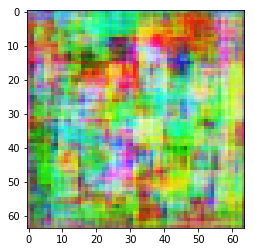

In [15]:
optimizer_G = optim.Adam(params=G.parameters(), lr=hyper['lr_G'], betas=hyper['betas'])
optimizer_D = optim.Adam(params=D.parameters(), lr=hyper['lr_D'], betas=hyper['betas'])

decay_iter = hyper['num_iteration'] - hyper['decay_start'] # if your number of iteration is greater 
if decay_iter > 0:
    lr_lambda_G = lambda x: (max(0,1-x/decay_iter))
    lr_lambda_D = lambda x: (max(0,1-x/(decay_iter*hyper['d_step'])))
    lr_sche_G = optim.lr_scheduler.LambdaLR(optimizer_G, lr_lambda=lr_lambda_G)
    lr_sche_D = optim.lr_scheduler.LambdaLR(optimizer_D, lr_lambda=lr_lambda_D)

    
def calc_advloss_D(real, fake, margin=1.0): # real should be 1, and fake should be 0, then loss is minium
    loss_real = torch.mean((real - fake.mean() - margin) ** 2)
    loss_fake = torch.mean((fake - real.mean() + margin) ** 2)
    loss = (loss_real + loss_fake) / 2
    
    return loss

def calc_advloss_G(real, fake, margin=1.0):# real should be 0, and fake should be 1, then loss is minium
    loss_real = torch.mean((real - fake.mean() + margin) ** 2)
    loss_fake = torch.mean((fake - real.mean() - margin) ** 2)
    loss = (loss_real + loss_fake) / 2
    
    return loss
criterion = nn.NLLLoss().to(device, torch.float32) # because log_softmax


# gennerate submission latent variables
def sample_latents(batch_size, z_dim, num_classes):
    latents = torch.randn((batch_size, z_dim), dtype=torch.float32, device=device)
    labels = torch.randint(0, num_classes, size=(batch_size,), dtype=torch.long, device=device)
    
    return latents, labels

# rvs(a, b, loc=0, scale=1, size=1, random_state=None)
def truncated_normal(size, threshold=2.0, dtype=torch.float32, device='cpu'): # truncated is better 
    x = scipy.stats.truncnorm.rvs(-threshold, threshold, size=size)
    x = torch.from_numpy(x).to(device, dtype)

    return x

def generate_eval_samples(generator, batch_size, z_dim, num_classes):
    latents = truncated_normal((batch_size, z_dim), dtype=torch.float32, device=device)
    labels =  torch.randint(0, num_classes, size=(batch_size,), dtype=torch.long, device=device)
    
    with torch.no_grad():
        imgs = (generator(latents, labels) + 1) / 2 # normalizing(-1,+1) to (0,1)
    
    return imgs

def show_generated_img(generator):
    imgs = generate_eval_samples(generator, 1, 100, 120).to("cpu")
    img = imgs.clone().detach().squeeze(0).numpy().transpose(1, 2, 0)
    plt.imshow(img)
    plt.show()
show_generated_img(GE)

[200/26000] Loss_D: 1.0644 Loss_G: 2.6948


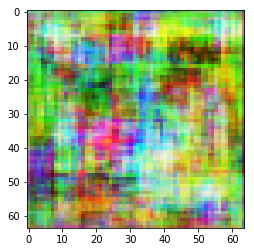

[400/26000] Loss_D: 1.1136 Loss_G: 2.4654


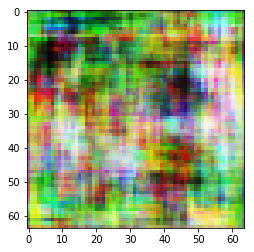

[600/26000] Loss_D: 1.1871 Loss_G: 2.8506


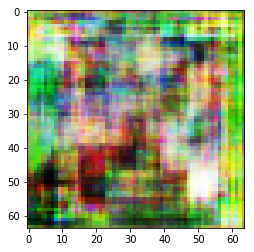

[800/26000] Loss_D: 0.9382 Loss_G: 2.8988


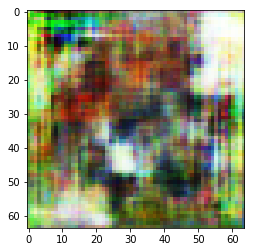

[1000/26000] Loss_D: 1.1641 Loss_G: 3.0144


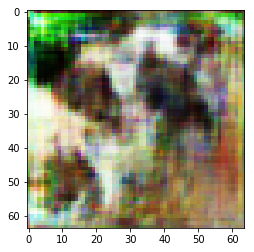

[1200/26000] Loss_D: 0.9985 Loss_G: 3.2524


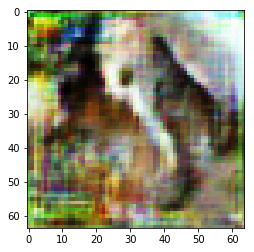

[1400/26000] Loss_D: 1.0022 Loss_G: 3.1553


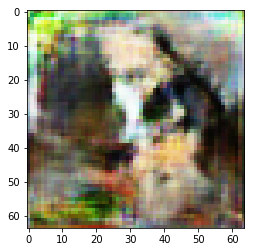

[1600/26000] Loss_D: 1.0378 Loss_G: 3.3260


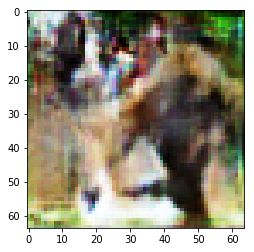

[1800/26000] Loss_D: 1.0307 Loss_G: 3.5679


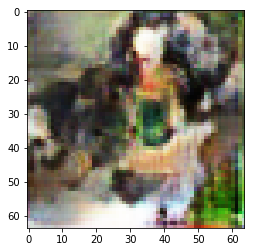

[2000/26000] Loss_D: 0.9573 Loss_G: 3.5181


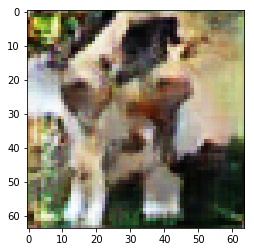

[2200/26000] Loss_D: 0.9889 Loss_G: 3.4869


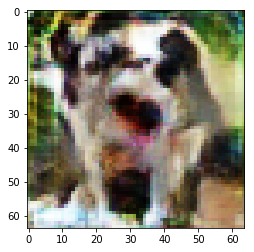

[2400/26000] Loss_D: 0.9071 Loss_G: 3.2297


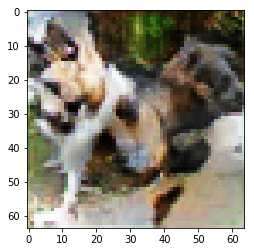

[2600/26000] Loss_D: 0.7986 Loss_G: 3.7756


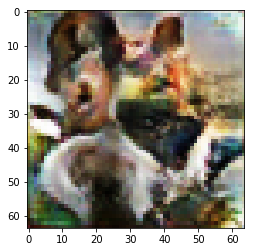

[2800/26000] Loss_D: 0.8859 Loss_G: 3.8085


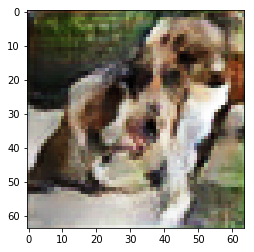

[3000/26000] Loss_D: 0.7905 Loss_G: 3.9778


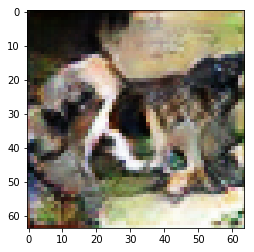

[3200/26000] Loss_D: 0.7388 Loss_G: 3.6270


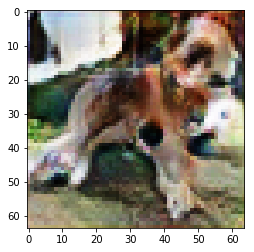

[3400/26000] Loss_D: 0.7505 Loss_G: 4.2787


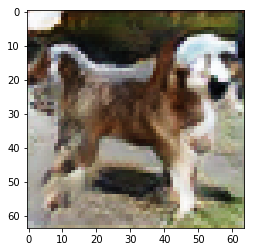

[3600/26000] Loss_D: 0.7564 Loss_G: 3.7636


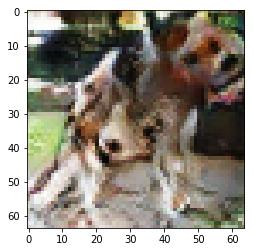

[3800/26000] Loss_D: 0.7636 Loss_G: 4.5553


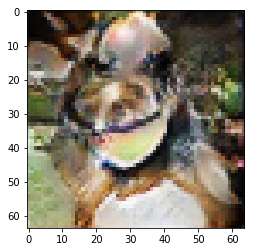

[4000/26000] Loss_D: 0.7106 Loss_G: 4.3142


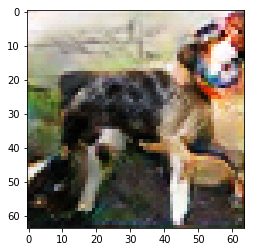

[4200/26000] Loss_D: 0.7333 Loss_G: 4.6156


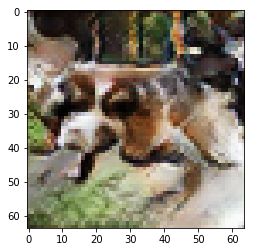

[4400/26000] Loss_D: 0.7457 Loss_G: 3.8029


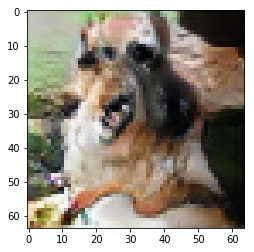

[4600/26000] Loss_D: 0.7065 Loss_G: 4.7075


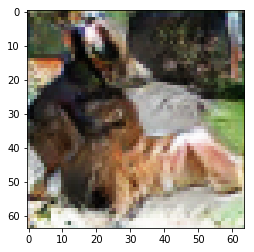

[4800/26000] Loss_D: 0.6513 Loss_G: 3.5760


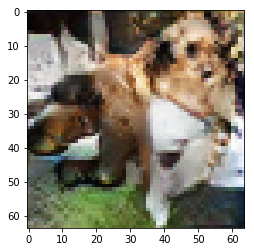

[5000/26000] Loss_D: 0.7204 Loss_G: 3.6881


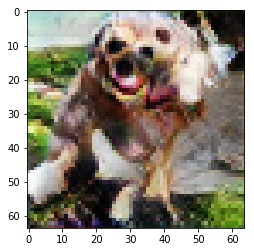

[5200/26000] Loss_D: 0.6468 Loss_G: 4.7543


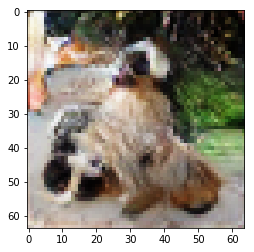

[5400/26000] Loss_D: 0.6346 Loss_G: 4.1407


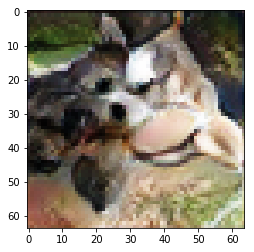

[5600/26000] Loss_D: 0.6510 Loss_G: 4.1511


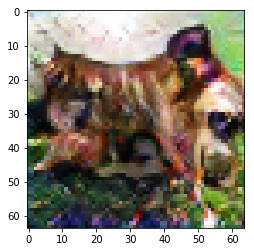

[5800/26000] Loss_D: 0.5266 Loss_G: 3.5450


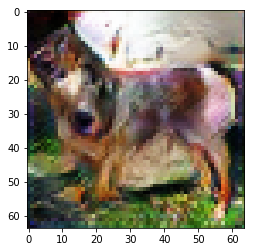

[6000/26000] Loss_D: 0.5438 Loss_G: 4.5247


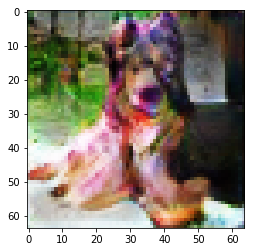

[6200/26000] Loss_D: 0.7616 Loss_G: 3.9875


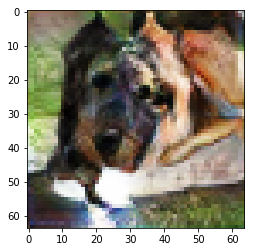

[6400/26000] Loss_D: 0.5826 Loss_G: 4.3619


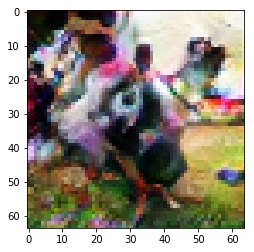

[6600/26000] Loss_D: 0.5495 Loss_G: 3.4313


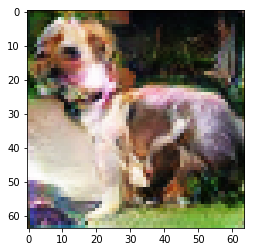

[6800/26000] Loss_D: 0.6557 Loss_G: 3.9307


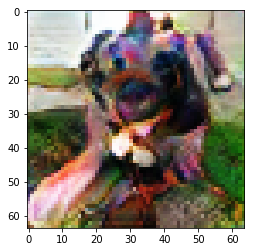

[7000/26000] Loss_D: 0.6035 Loss_G: 4.2309


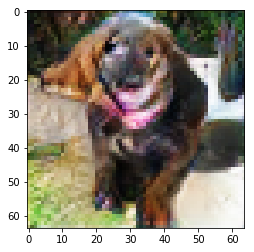

[7200/26000] Loss_D: 0.6300 Loss_G: 4.5599


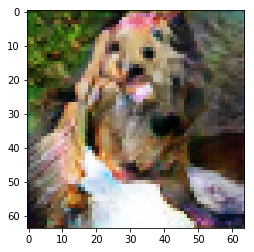

[7400/26000] Loss_D: 0.4395 Loss_G: 4.2444


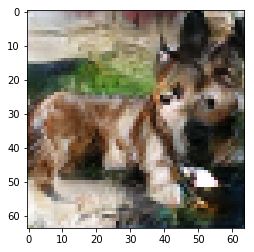

[7600/26000] Loss_D: 0.5065 Loss_G: 3.4175


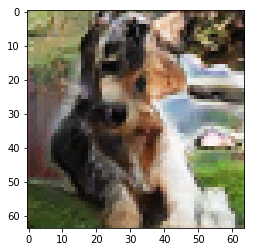

[7800/26000] Loss_D: 0.5179 Loss_G: 4.2650


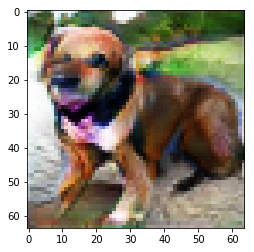

[8000/26000] Loss_D: 0.5559 Loss_G: 4.2739


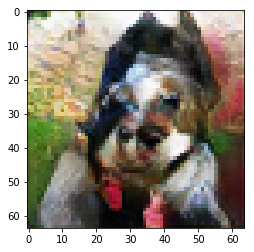

[8200/26000] Loss_D: 0.5048 Loss_G: 4.0884


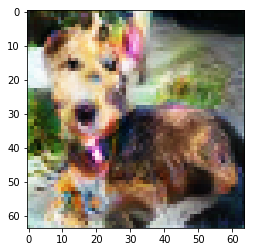

[8400/26000] Loss_D: 0.5648 Loss_G: 4.9053


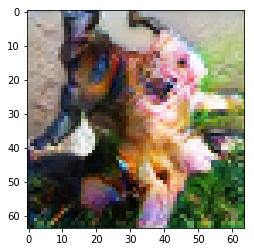

[8600/26000] Loss_D: 0.5148 Loss_G: 4.7958


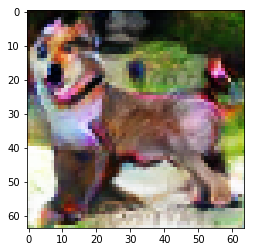

[8800/26000] Loss_D: 0.4671 Loss_G: 4.1292


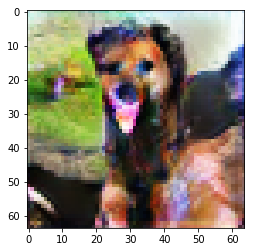

[9000/26000] Loss_D: 0.5634 Loss_G: 4.7472


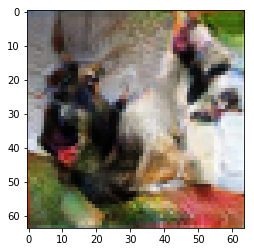

[9200/26000] Loss_D: 0.4770 Loss_G: 3.7941


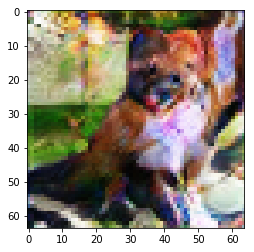

[9400/26000] Loss_D: 0.4542 Loss_G: 4.0265


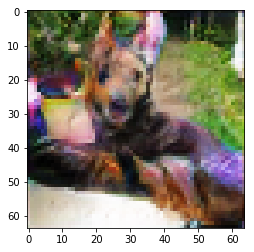

[9600/26000] Loss_D: 0.4441 Loss_G: 4.0922


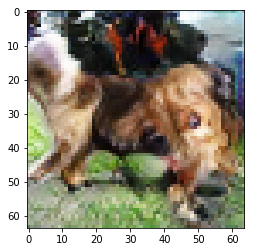

[9800/26000] Loss_D: 0.4884 Loss_G: 5.0712


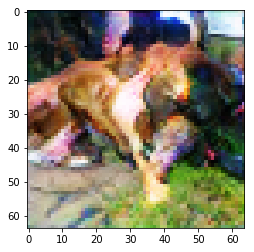

[10000/26000] Loss_D: 0.4648 Loss_G: 3.2289


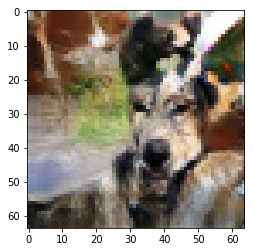

[10200/26000] Loss_D: 0.3930 Loss_G: 4.1081


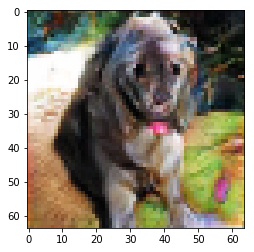

[10400/26000] Loss_D: 0.4455 Loss_G: 3.9502


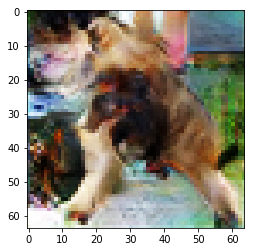

[10600/26000] Loss_D: 0.4434 Loss_G: 4.4478


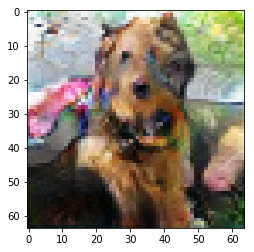

[10800/26000] Loss_D: 0.4483 Loss_G: 3.7970


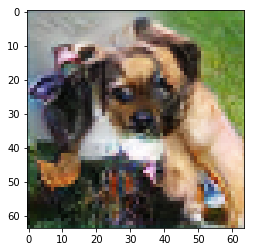

[11000/26000] Loss_D: 0.4479 Loss_G: 4.1112


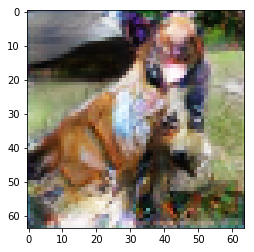

[11200/26000] Loss_D: 0.4709 Loss_G: 4.2200


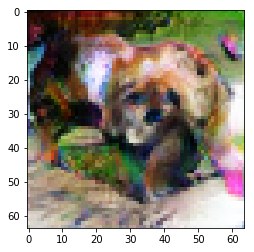

[11400/26000] Loss_D: 0.3950 Loss_G: 4.0958


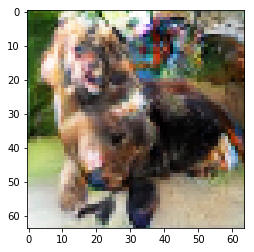

[11600/26000] Loss_D: 0.4617 Loss_G: 3.0728


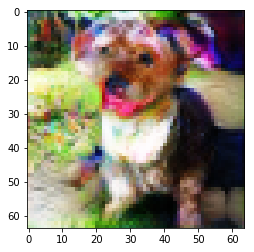

[11800/26000] Loss_D: 0.4875 Loss_G: 4.7177


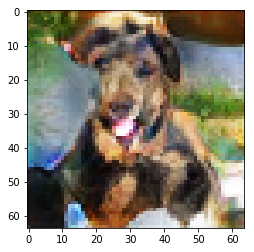

[12000/26000] Loss_D: 0.4165 Loss_G: 3.0467


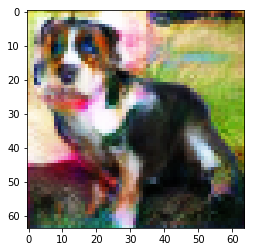

[12200/26000] Loss_D: 0.3794 Loss_G: 3.3307


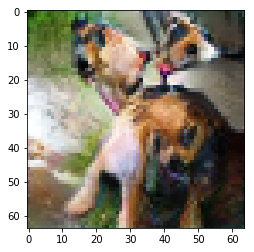

[12400/26000] Loss_D: 0.3775 Loss_G: 4.3624


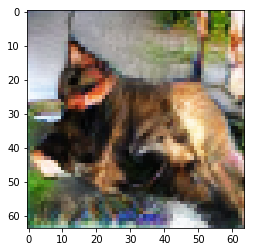

[12600/26000] Loss_D: 0.3678 Loss_G: 4.2237


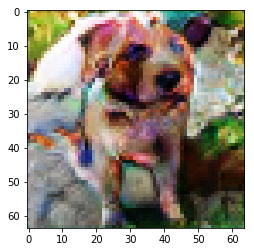

[12800/26000] Loss_D: 0.3897 Loss_G: 4.7370


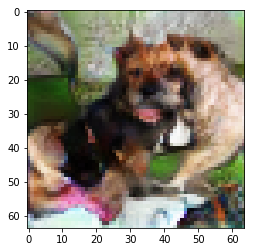

[13000/26000] Loss_D: 0.3446 Loss_G: 4.1289


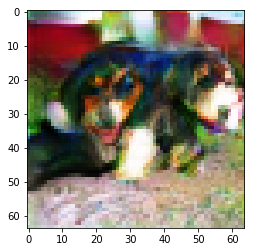

[13200/26000] Loss_D: 0.3900 Loss_G: 3.7199


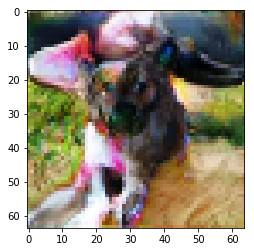

[13400/26000] Loss_D: 0.3529 Loss_G: 3.7828


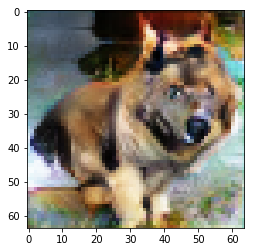

[13600/26000] Loss_D: 0.3476 Loss_G: 2.9214


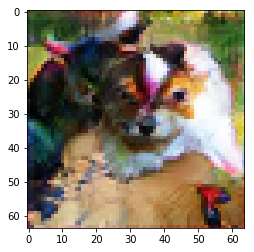

[13800/26000] Loss_D: 0.4354 Loss_G: 4.0423


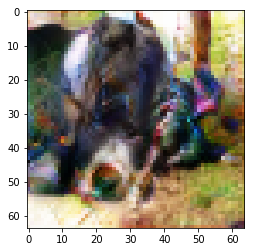

[14000/26000] Loss_D: 0.3411 Loss_G: 3.1907


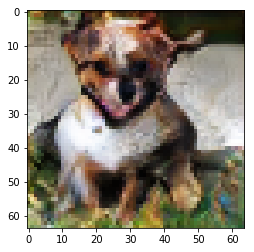

[14200/26000] Loss_D: 0.4756 Loss_G: 4.3403


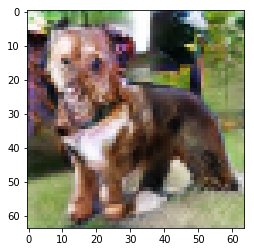

[14400/26000] Loss_D: 0.3134 Loss_G: 4.0509


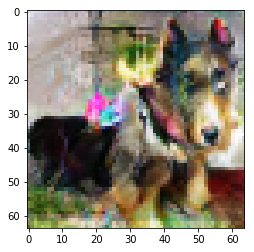

[14600/26000] Loss_D: 0.3715 Loss_G: 3.8085


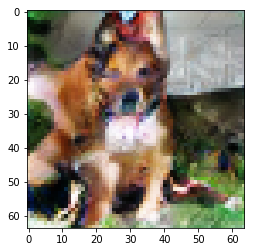

[14800/26000] Loss_D: 0.3162 Loss_G: 3.0656


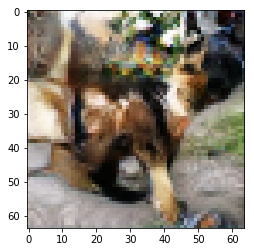

[15000/26000] Loss_D: 0.3334 Loss_G: 2.9733


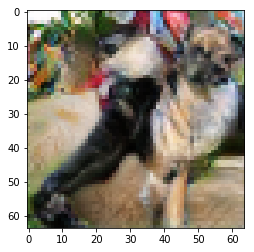

[15200/26000] Loss_D: 0.3797 Loss_G: 2.6124


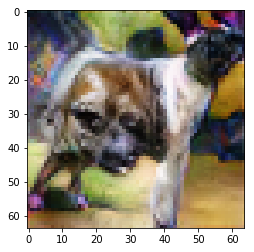

[15400/26000] Loss_D: 0.3769 Loss_G: 3.2703


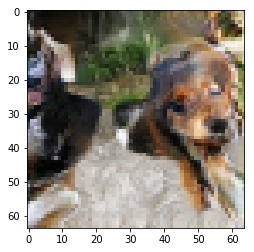

[15600/26000] Loss_D: 0.3775 Loss_G: 4.7844


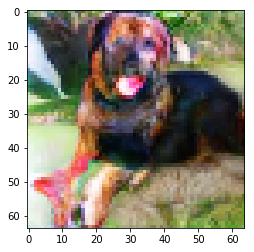

[15800/26000] Loss_D: 0.4272 Loss_G: 3.5068


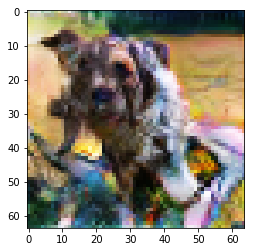

[16000/26000] Loss_D: 0.3390 Loss_G: 3.8657


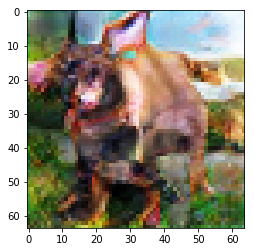

[16200/26000] Loss_D: 0.4693 Loss_G: 4.7990


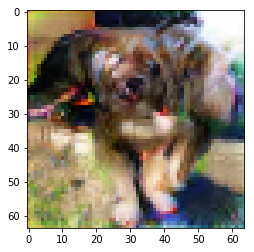

[16400/26000] Loss_D: 0.3096 Loss_G: 3.9991


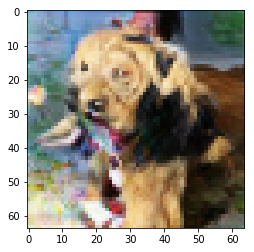

[16600/26000] Loss_D: 0.3518 Loss_G: 4.2676


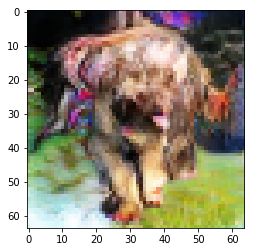

[16800/26000] Loss_D: 0.3249 Loss_G: 3.2933


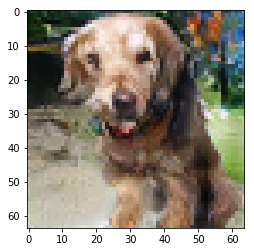

[17000/26000] Loss_D: 0.3106 Loss_G: 4.2642


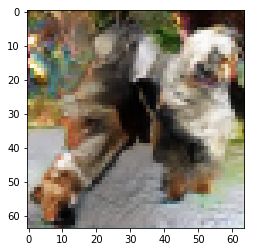

[17200/26000] Loss_D: 0.3487 Loss_G: 4.5217


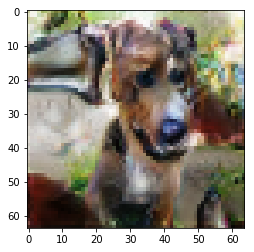

[17400/26000] Loss_D: 0.3540 Loss_G: 4.1510


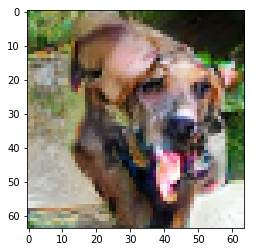

[17600/26000] Loss_D: 0.3063 Loss_G: 4.3795


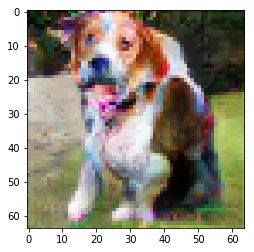

[17800/26000] Loss_D: 0.3230 Loss_G: 4.6585


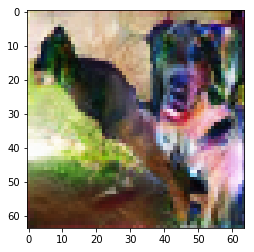

[18000/26000] Loss_D: 0.3150 Loss_G: 3.6143


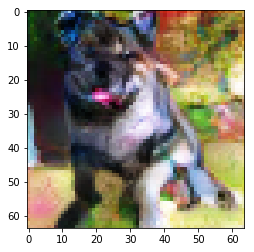

[18200/26000] Loss_D: 0.3173 Loss_G: 3.9824


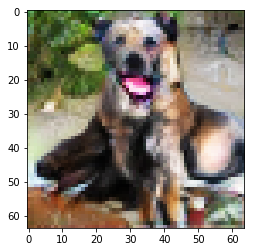

[18400/26000] Loss_D: 0.3035 Loss_G: 3.2968


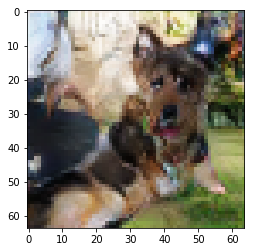

[18600/26000] Loss_D: 0.2677 Loss_G: 4.2368


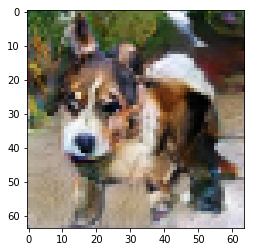

[18800/26000] Loss_D: 0.3807 Loss_G: 5.0905


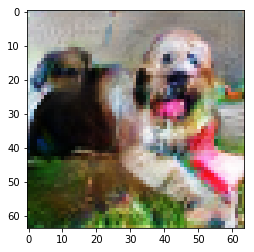

[19000/26000] Loss_D: 0.3007 Loss_G: 4.3104


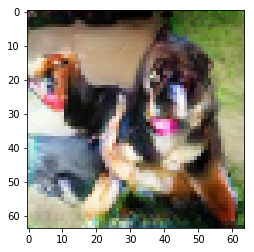

[19200/26000] Loss_D: 0.3202 Loss_G: 4.2549


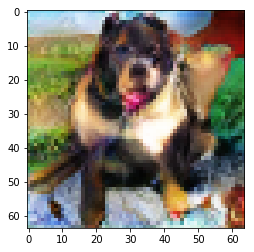

[19400/26000] Loss_D: 0.3858 Loss_G: 4.6504


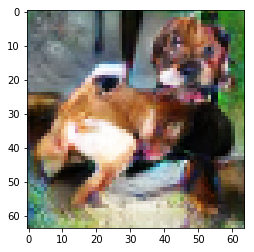

[19600/26000] Loss_D: 0.2680 Loss_G: 3.4519


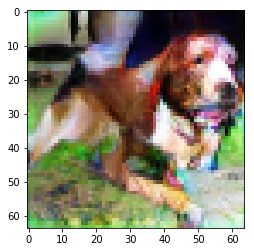

[19800/26000] Loss_D: 0.2732 Loss_G: 3.5123


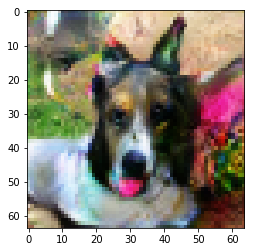

[20000/26000] Loss_D: 0.3112 Loss_G: 3.6570


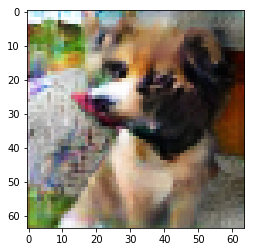

[20200/26000] Loss_D: 0.2876 Loss_G: 4.3162


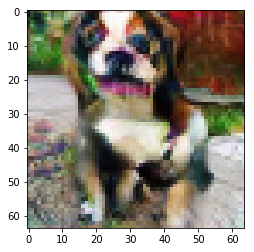

[20400/26000] Loss_D: 0.2567 Loss_G: 3.7226


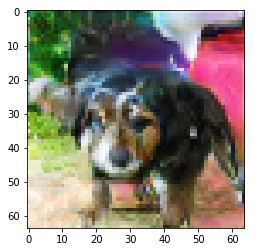

[20600/26000] Loss_D: 0.2602 Loss_G: 4.5631


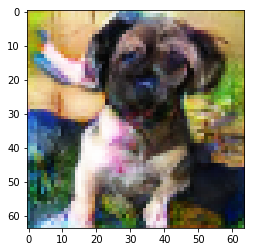

[20800/26000] Loss_D: 0.2765 Loss_G: 4.4187


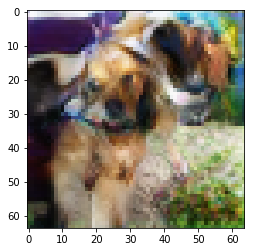

[21000/26000] Loss_D: 0.2998 Loss_G: 4.4494


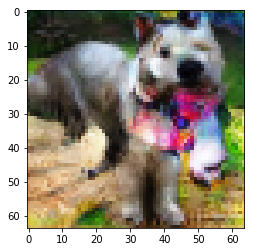

[21200/26000] Loss_D: 0.3503 Loss_G: 4.7466


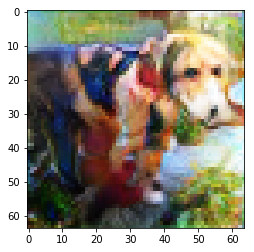

[21400/26000] Loss_D: 0.2794 Loss_G: 4.8602


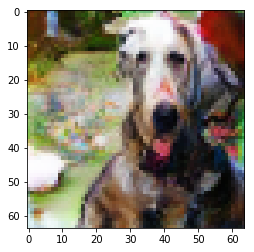

[21600/26000] Loss_D: 0.2792 Loss_G: 4.3166


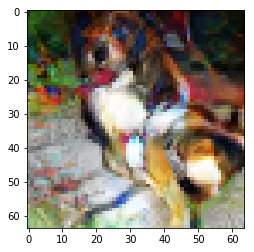

[21800/26000] Loss_D: 0.2614 Loss_G: 4.2278


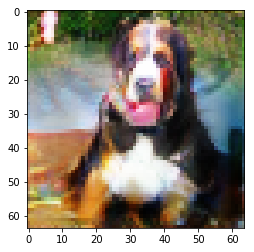

[22000/26000] Loss_D: 0.3414 Loss_G: 4.4119


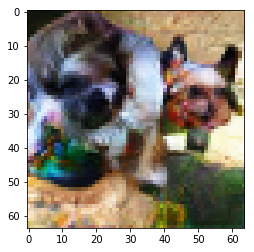

[22200/26000] Loss_D: 0.2781 Loss_G: 4.3390


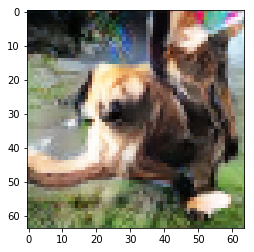

[22400/26000] Loss_D: 0.2741 Loss_G: 4.1096


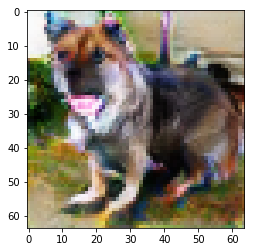

[22600/26000] Loss_D: 0.2222 Loss_G: 3.9861


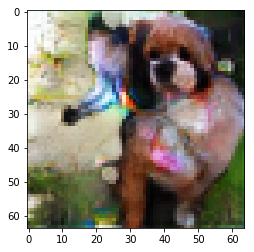

[22800/26000] Loss_D: 0.2977 Loss_G: 4.1317


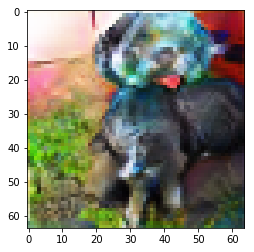

[23000/26000] Loss_D: 0.2645 Loss_G: 3.0985


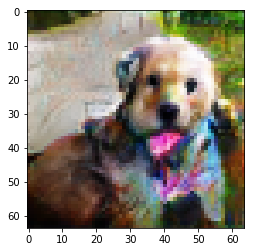

[23200/26000] Loss_D: 0.1983 Loss_G: 3.5607


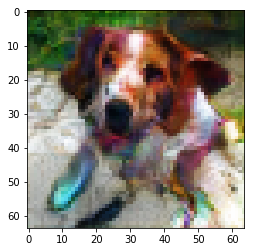

[23400/26000] Loss_D: 0.2746 Loss_G: 3.3293


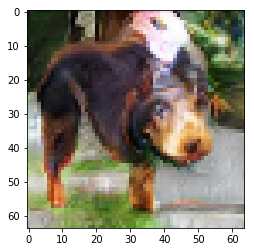

[23600/26000] Loss_D: 0.2873 Loss_G: 4.7102


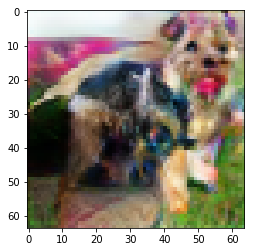

[23800/26000] Loss_D: 0.3001 Loss_G: 4.6805


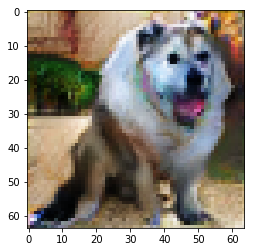

[24000/26000] Loss_D: 0.2390 Loss_G: 3.3173


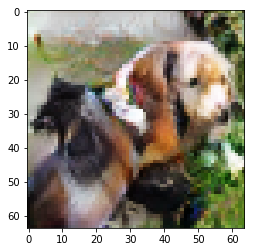

[24200/26000] Loss_D: 0.2318 Loss_G: 4.4187


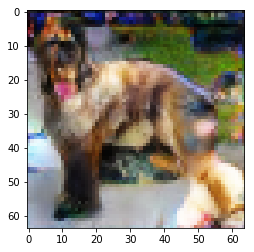

[24400/26000] Loss_D: 0.2482 Loss_G: 4.4226


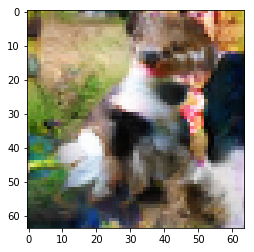

[24600/26000] Loss_D: 0.2232 Loss_G: 4.3337


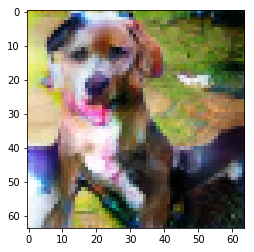

[24800/26000] Loss_D: 0.2332 Loss_G: 4.4262


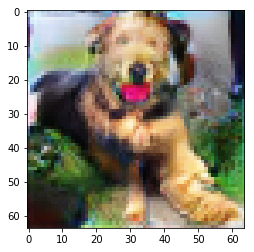

[25000/26000] Loss_D: 0.2073 Loss_G: 3.6558


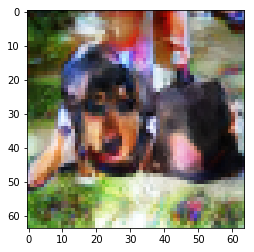

[25200/26000] Loss_D: 0.2156 Loss_G: 4.0363


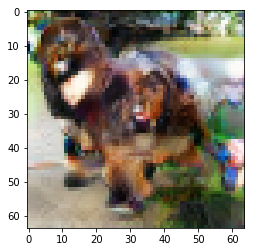

[25400/26000] Loss_D: 0.1787 Loss_G: 4.0757


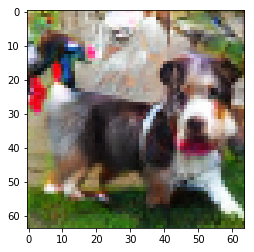

[25600/26000] Loss_D: 0.1495 Loss_G: 4.3579


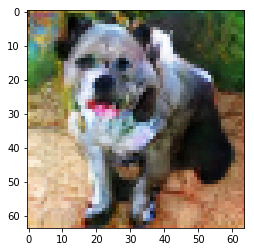

[25800/26000] Loss_D: 0.1685 Loss_G: 4.1808


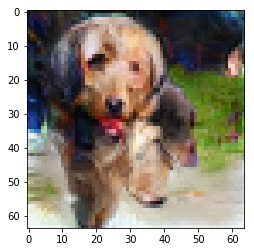

[26000/26000] Loss_D: 0.1281 Loss_G: 3.7479


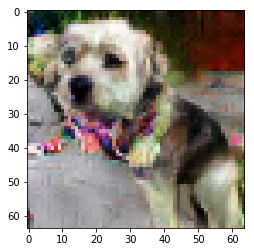

total step: 26000


In [16]:
step = 1

while True:
    for i in range(hyper['d_step']): # 1
        for param in D.parameters():
            param.requires_grad_(True)
        #########
        #train D
        #########
        optimizer_D.zero_grad()
        
        #real image and related labels
        real_imgs, real_labels = next(iter(trainloader))
        batch_size = real_imgs.size(0)
        
        # fake images and related labels
        latents, fake_labels = sample_latents(batch_size, **hyper['sample_z'])
        #print(latents.size(),fake_labels.size())
        fake_imgs = G(latents, fake_labels).detach() # once detach then no grad pass
        
        preds_real, preds_real_labels = D(real_imgs, real_labels) # real exam
        #print(preds_real, preds_real_labels)
        preds_fake, _ = D(fake_imgs, fake_labels) # fake exam
        
        loss_D = calc_advloss_D(preds_real, preds_fake, hyper['margin'])
        loss_D += hyper['gamma'] * criterion(preds_real_labels, real_labels) #breed is not that important loss
        loss_D.backward()
        optimizer_D.step()
        if (decay_iter > 0) and (step > hyper['decay_start']):
            lr_sche_D.step()
            
            
    ###########
    ##Generator
    ###########
    for param in D.parameters(): # now freeing the parameters to train G
        param.requires_grad_(False)
        
    optimizer_G.zero_grad()
    real_imgs, real_labels = next(iter(trainloader))
    batch_size = real_imgs.size(0)
    # fake images and related labels
    latents, fake_labels = sample_latents(batch_size, **hyper['sample_z'])
    fake_imgs = G(latents, fake_labels)# No detach then no grad pass
    
    preds_real, _ = D(real_imgs, real_labels) # real exam,labels is not important
    preds_fake, preds_fake_labels  = D(fake_imgs, fake_labels) # fake exam
    
    
    loss_G = calc_advloss_G(preds_real,preds_fake,hyper['margin'])
    loss_G += hyper['gamma'] * criterion(preds_fake_labels, fake_labels)
    loss_G.backward()
    optimizer_G.step()
    
    if (decay_iter > 0) and (step > hyper['decay_start']):
        lr_sche_G.step()
    
    for p_G,p_GE in zip(G.parameters(),GE.parameters()): # update weight
        p_GE.data.mul_(hyper['ema']).add_((1 - hyper['ema']) * p_G.data)
    
    for b_G,b_GE in zip(G.buffers(),GE.buffers()):
        b_GE.data.mul_(hyper['ema']).add_((1 - hyper['ema']) * b_G.data)
    
    #print(loss_D.item(),loss_G.item())
        
    if step < hyper['num_iteration']:
        step += 1
    else:
        print('total step: {}'.format(step))
        break
             
    if step%200 ==0:
        print('[%d/%d] Loss_D: %.4f Loss_G: %.4f'
                  % (step, hyper['num_iteration'],
                     loss_D.item(),loss_G.item()))
        show_generated_img(GE)

 We have 12 batches !!


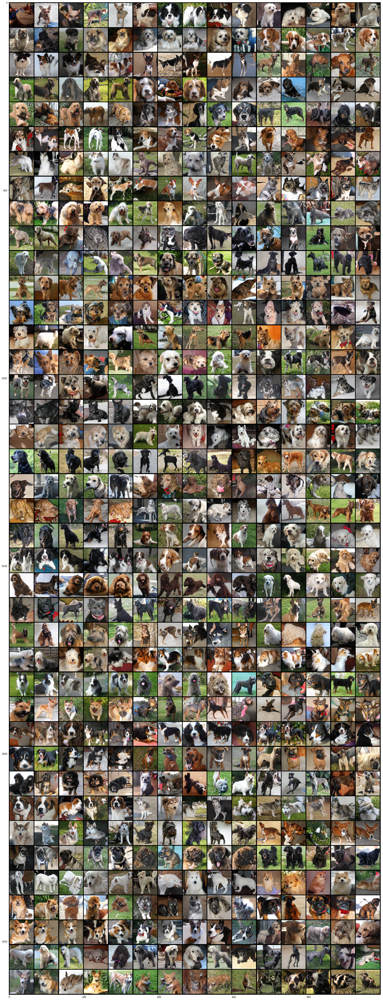

In [17]:
repeat_breeds = 5
nrow = 15
batch_size_test = 50

latent_dim = hyper['sample_z']['z_dim']
num_classes = hyper['sample_z']['num_classes']

all_labels = torch.arange(num_classes, dtype=torch.long, device=device)
all_labels = all_labels.repeat_interleave(repeat_breeds)
batch_labels = all_labels.split(batch_size_test)
print(' We have {} batches !!'.format(len(batch_labels)))

imgs_list = []
for labels in batch_labels:
    batch_size = labels.size(0)
    latents = truncated_normal((batch_size, latent_dim),# latent vectors 
                               threshold=1.5, dtype=torch.float32, device=device)
    with torch.no_grad():
        imgs = (GE(latents, labels) + 1) / 2
        imgs_list.append(imgs)
all_imgs = torch.cat(imgs_list, dim=0) # merging into 1 tensor.
all_imgs = make_grid(all_imgs, nrow=nrow, normalize=False) #
all_imgs = all_imgs.mul_(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to('cpu', torch.uint8).numpy()

plt.figure(figsize=(2*nrow, 2*(num_classes*repeat_breeds)//nrow))
plt.imshow(all_imgs);
        


In [18]:
if not os.path.exists('../output_images'):
    os.mkdir('../output_images')
    
im_batch_size = 50
n_images=10000

for i_batch in tqdm(range(0, n_images, im_batch_size)):
    imgs = generate_eval_samples(GE,im_batch_size, **hyper['sample_z'])
    for j, img in enumerate(imgs):
        save_image(img, os.path.join('../output_images', f'image_{i+j:05d}.png'))
shutil.make_archive('Dogs_data','zip','../output_images')

'/kaggle/working/Dogs_data.zip'